In [1]:
import numpy as np
import matplotlib.pyplot as plt
from ics.cobraCharmer import pfiDesign


from bokeh.io import output_notebook, show, export_png,export_svgs, save
from bokeh.plotting import figure, show, output_file
import bokeh.palettes
from bokeh.layouts import column,gridplot
from bokeh.models import HoverTool, ColumnDataSource, LinearColorMapper
from bokeh.models.glyphs import Text
from bokeh.palettes import Category20
from bokeh.palettes import inferno

output_notebook()

Loading BokehJS ...

In [3]:
phiPath =  '/Volumes/GoogleDrive/My Drive/PFS/CobraModuleTestResult/Science15/Data/20190801/phiConvergeTest/'
phiData = np.load(phiPath+'phiData.npy')
thetaPath =  '/Volumes/GoogleDrive/My Drive/PFS/CobraModuleTestResult/Science15/Data/20190821/thetaConvergeTest/'
thetaData = np.load(thetaPath+'thetaData.npy')

In [14]:
centers = np.load(phiPath+'phiCenter.npy')


array([   0.           +0.j        , 1937.67683861+1013.29123508j,
       1887.12950797 +885.10220456j, 1851.77795397+1013.17902891j,
       1804.02530545 +881.77056345j, 1765.00040821+1013.02814056j,
       1718.19746207 +883.10649414j, 1677.25638709+1012.49404247j,
       1629.4054318  +881.70504203j, 1590.56475046+1010.77819216j,
       1539.31669695 +882.25175118j, 1503.23737701+1011.80348563j,
       1451.56110786 +881.15279197j, 1414.0424549 +1009.88141438j,
       1365.12025406 +879.85119681j, 1325.18720923+1010.14728126j,
       1276.70890317 +880.00744918j, 1237.53355203+1010.5304538j ,
       1190.2961675  +879.30769031j, 1151.06770413+1008.73298466j,
       1103.32757849 +879.98717005j, 1059.19986184+1007.77851424j,
       1015.91259382 +877.44794256j,  974.23535317+1007.97118606j,
        930.0724525  +877.35746912j,  886.14313026+1006.88921219j,
        841.19781531 +877.75751193j,  801.75215093+1004.98476946j,
        752.61212603 +877.72663921j, 1908.83418995 +969.539355

In [15]:
phiData

array([[[[0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
         [0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
         [0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
         ...,
         [0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
         [0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
         [0.00000000e+00, 0.00000000e+00, 0.00000000e+00]],

        [[0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
         [0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
         [0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
         ...,
         [0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
         [0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
         [0.00000000e+00, 0.00000000e+00, 0.00000000e+00]],

        [[0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
         [0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
         [0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
         ...,
         [0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
         [

In [5]:
brokens = [1,55]
badIdx = np.array(brokens) - 1
goodIdx = np.array([e for e in range(57) if e not in badIdx])

In [7]:
x = np.arange(9)

In [7]:
np.rad2deg(np.append([0], phiData[1,0,:,0]))

array([ 0.        , 16.34334188, 15.30743505, 15.06187711, 15.0299356 ,
       15.02432021, 15.02287598, 15.02027231, 15.02633936])

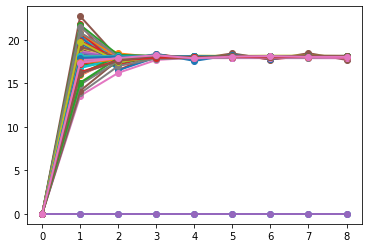

In [8]:
plt.figure(1)
plt.clf()
for cob in goodIdx:
    for ite in range(1,2):
        plt.plot(x, np.rad2deg(np.append([0], phiData[cob,ite,:,0])), marker='o', linewidth=2)

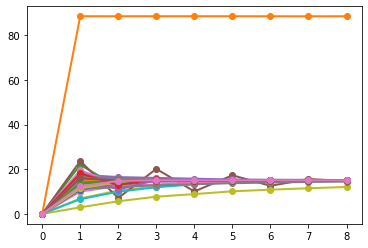

In [9]:
plt.figure(2)
plt.clf()
for cob in goodIdx:
    for ite in range(1):
        plt.plot(x, np.rad2deg(np.append([0], thetaData[cob,ite,:,0])), marker='o', linewidth=2)

In [9]:
runs=50
margin = 15
output_file("spare15_phi_convergence.html")

def plotPhiConvergence(phiData, runs, fiberNo):
    TOOLS = ['pan','box_zoom','wheel_zoom', 'save' ,'reset','hover']

    title_string=f"Fiber {fiberNo+1} Phi"
    p = figure( tools=TOOLS, x_range=[0,9], y_range=[-20,180],
               plot_height=400, plot_width=500,title=title_string)
    p.xaxis.axis_label = 'Iteration Number'
    p.yaxis.axis_label = 'Angle Difference from Phi Target'

    #mapper = Category40[runs]
    mapper = inferno(runs)

    for i in range(runs):
        angle = margin + (180 - 2 * margin) * i / (runs - 1)
        ydata= angle - np.rad2deg(np.append([0], phiData[fiberNo,i,:,0]))
        p.circle(x=x, y=ydata,radius=0.08,color=mapper[-i])
        p.line(x=x, y=ydata,line_width=2,color=mapper[-i])
    return p

parray=[]

for fiberNo in goodIdx:
    p=plotPhiConvergence(phiData, runs, fiberNo)
    parray.append(p)

grid = gridplot(parray, ncols=4, plot_width=250, plot_height=250)
show(grid)

In [10]:
runs=50
output_file("science15_theta_convergence.html")
margin = 15

def plotThetaConvergence(thetaData, runs, fiberNo):
    TOOLS = ['pan','box_zoom','wheel_zoom', 'save' ,'reset','hover']

    title_string=f"Fiber {fiberNo+1} Theta"
    p = figure( tools=TOOLS, x_range=[0,9], y_range=[-20,360],
               plot_height=400, plot_width=500,title=title_string)
    p.xaxis.axis_label = 'Iteration Number'
    p.yaxis.axis_label = 'Angle Difference from Theta Target'

    mapper = inferno(runs)
    for i in range(runs):
        angle = margin + (360 - 2 * margin) * i / (runs - 1)
        ydata= angle - np.rad2deg(np.append([0], thetaData[fiberNo,i,:,0]))
        p.circle(x=x, y=ydata,radius=0.08,color=mapper[-i])
        p.line(x=x, y=ydata,line_width=2,color=mapper[-i])
    return p

parray=[]

for fiberNo in goodIdx:
    p=plotThetaConvergence(thetaData, runs, fiberNo)
    parray.append(p)

grid = gridplot(parray, ncols=4, plot_width=250, plot_height=250)
show(grid)

In [ ]:
margin=15
runs = 5
for i in range(runs):
    angle = margin + (360 - 2 * margin) * i / (runs - 1)
    print(angle)

In [ ]:
np.rad2deg(phiData[56,1,:,0]), np.rad2deg(phiData[56,2,:,0]),

In [ ]:
np.rad2deg(thetaData[np.array([7,16,20,30]),0,7,0])

In [ ]:
np.rad2deg(thetaData[:,0,7,0]), np.rad2deg(thetaData[:,1,7,0])

In [ ]:
plt.figure(3)
plt.clf()
ite = 2

plt.subplot(211)
for cob in goodIdx[goodIdx <= 26]:
    plt.plot(phiData[cob,ite,:,1], phiData[cob,ite,:,2], 'go')

plt.subplot(212)
for cob in goodIdx[goodIdx > 26]:
    plt.plot(phiData[cob,ite,:,1], phiData[cob,ite,:,2], 'go')

In [ ]:
plt.figure(4)
plt.clf()
ite = 0

plt.subplot(211)
for cob in goodIdx[goodIdx <= 26]:
    plt.plot(thetaData[cob,ite,:,1], thetaData[cob,ite,:,2], 'go')

plt.subplot(212)
for cob in goodIdx[goodIdx > 26]:
    plt.plot(thetaData[cob,ite,:,1], thetaData[cob,ite,:,2], 'go')

In [ ]:
from bokeh.palettes import Category20
from bokeh.palettes import inferno

# Re-analyze the data

In [15]:
runs =50
tries = 8
margin = 15
brokens = [1,55]
badIdx = np.array(brokens) - 1
goodIdx = np.array([e for e in range(57) if e not in badIdx])

xml = '/Volumes/GoogleDrive/My Drive/PFS/CobraModuleTestResult/Science15/Data/20190802/theta50Step/science15_theta50step_20190802.xml'
model = pfiDesign.PFIDesign(xml)

thetaPath =  '/Volumes/GoogleDrive/My Drive/PFS/CobraModuleTestResult/Science15/Data/20190802/thetaConvergeTest/'
thetaFW = np.load(thetaPath+'thetaFW.npy')
thetaRV = np.load(thetaPath+'thetaRV.npy')
thetaCenter =  np.load(thetaPath+'thetaCenter.npy')
thetaRadius =  np.load(thetaPath+'thetaRadius.npy')
thetaHS =  np.load(thetaPath+'/thetaHS.npy')


thetaData = np.zeros((57, runs, tries, 3))
zeros = np.zeros(len(goodIdx))
centers = thetaCenter[goodIdx]
homes = thetaHS[goodIdx]
tGaps = ((model.tht1 - model.tht0) % (np.pi*2))[goodIdx]

for i in range(runs):
    if runs > 1:
        angle = np.deg2rad(margin + (360 - 2 * margin) * i / (runs - 1))
    else:
        angle = np.deg2rad(180)
    self.pfi.moveThetaPhi(self.goodCobras, zeros + angle, zeros, thetaFast=fast)
    cAngles, cPositions = self.measureAngles(centers, homes)
    for k in range(len(goodIdx)):
        if angle > np.pi + tGaps[k] and cAngles[k] < tGaps[k] + 0.1:
            cAngles[k] += np.pi*2
    thetaData[goodIdx, i, 0, 0] = cAngles
    thetaData[goodIdx, i, 0, 1] = np.real(cPositions)
    thetaData[goodIdx, i, 0, 2] = np.imag(cPositions)

    for j in range(tries - 1):
        dirs = angle > cAngles
        self.pfi.moveThetaPhi(self.goodCobras, angle - cAngles, zeros, thetaFroms=cAngles, thetaFast=fast)
        cAngles, cPositions = self.measureAngles(centers, homes)
        for k in range(len(goodIdx)):
            lastAngle = thetaData[goodIdx[k], i, j, 0]
            if dirs[k] and cAngles[k] < lastAngle - 0.01 and cAngles[k] < tGaps[k] + 0.1:
                cAngles[k] += np.pi*2
            elif not dirs[k] and cAngles[k] > lastAngle + 0.01 and cAngles[k] > np.pi*2 - 0.1:
                cAngles[k] -= np.pi*2
        thetaData[goodIdx, i, j+1, 0] = cAngles
        thetaData[goodIdx, i, j+1, 1] = np.real(cPositions)
        thetaData[goodIdx, i, j+1, 2] = np.imag(cPositions)



NameError: name 'self' is not defined

# Ploting Angle Histogram of Angle Difference at Iteration

In [1]:
import numpy as np
import matplotlib.pyplot as plt
from ics.cobraCharmer import pfiDesign
import matplotlib.gridspec as gridspec

In [3]:
brokens = [1,55]
badIdx = np.array(brokens) - 1
goodIdx = np.array([e for e in range(57) if e not in badIdx])

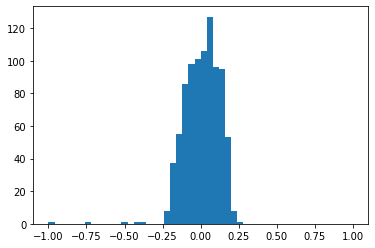

In [44]:
path='20191120_009'
dataPath = f'/data/MCS/{path}/data/'
phiData = np.load(dataPath+'phiData.npy')
diff= []
runs = 16
margin = 15
ite=7
for i in range(runs):
    if runs > 1:
        angle = np.deg2rad(margin + (180 - 2 * margin) * i / (runs - 1))
    else:
        angle = np.deg2rad(180)
    for cob in goodIdx:
        diff.append(np.rad2deg(angle - phiData[cob,i,ite,0]))
diff = np.array(diff)
n, bins, patches=plt.hist(diff, bins=50,range=(-1,1))


In [22]:
n

array([ 18.,  71.,  69.,  86., 111., 138., 140., 145.,  87.,  15.])

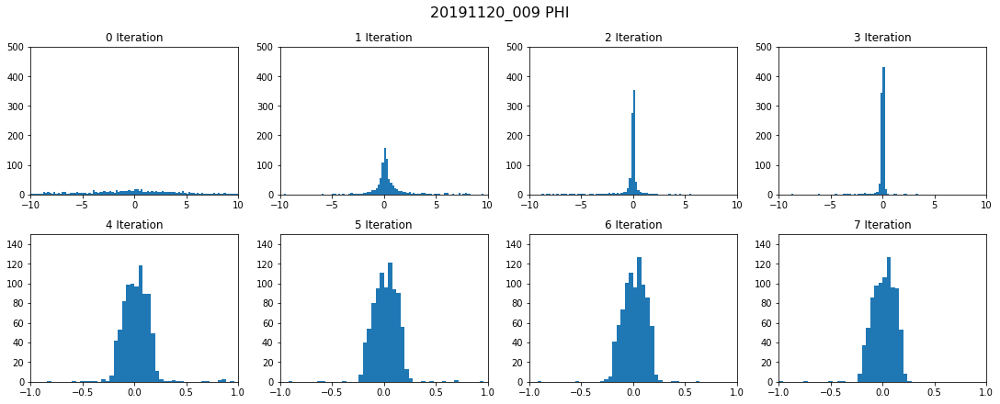

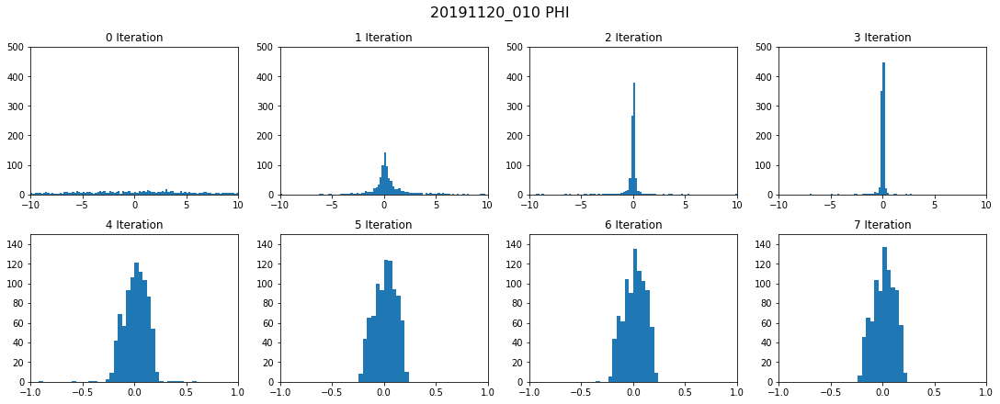

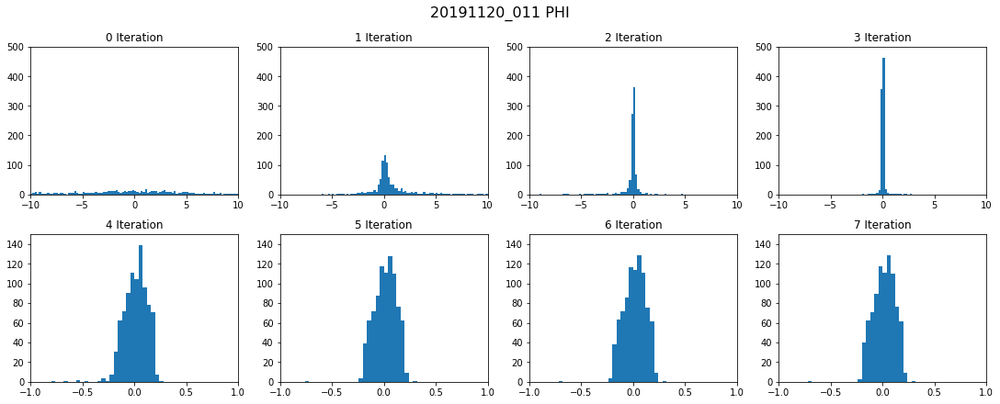

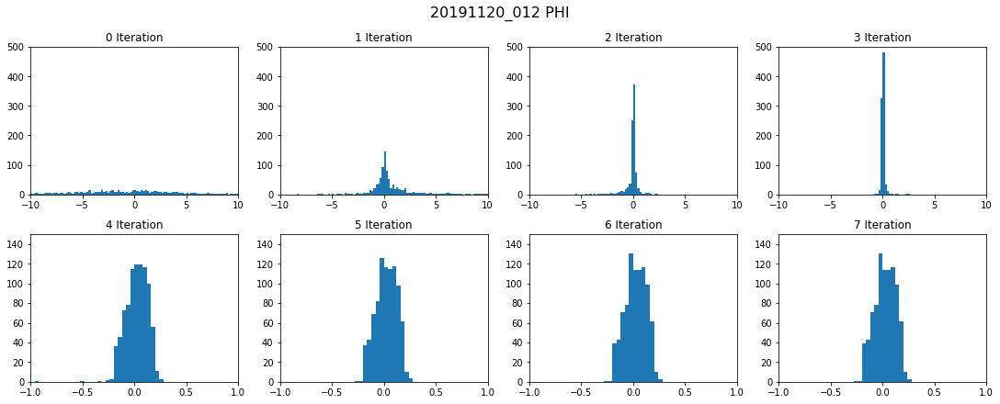

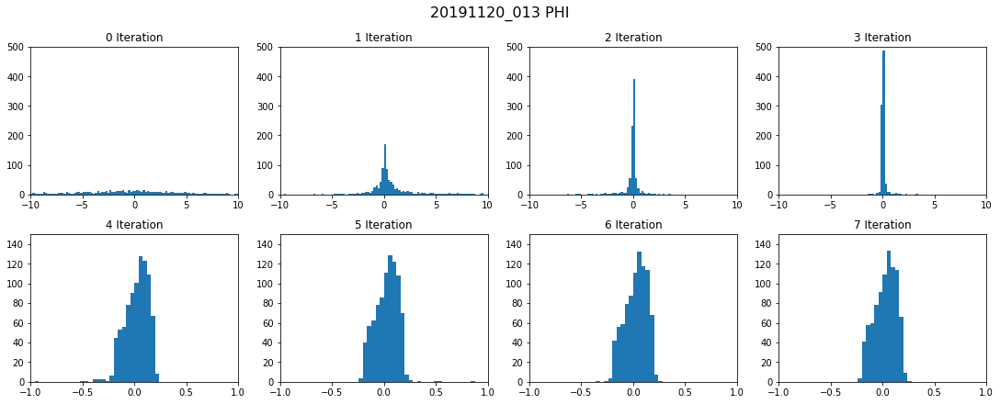

In [56]:
dirList=['20191120_009', '20191120_010', '20191120_011', '20191120_012', '20191120_013']

for path in dirList:
    dataPath = f'/data/MCS/{path}/data/'
    phiData = np.load(dataPath+'phiData.npy')
    
    fig, fax = plt.subplots(figsize=(15, 6),ncols=4, nrows=2, constrained_layout=True)
    fig.suptitle(f'{path} PHI', fontsize=16)
    for ite in range(8):
        diff = []
        runs = 16
        margin = 15
        for i in range(runs):
            if runs > 1:
                angle = np.deg2rad(margin + (180 - 2 * margin) * i / (runs - 1))
            else:
                angle = np.deg2rad(180)
            for cob in goodIdx:
                diff.append(np.rad2deg(angle - phiData[cob,i,ite,0]))
        x= (np.arange(100)-50)/100
        diff = np.array(diff)

        
        if ite < 4:
            fax[int(ite/4), ite%4].hist(diff, bins=100,range=(-10,10))
            fax[int(ite/4), ite%4].set_xlim([-10, 10])
            fax[int(ite/4), ite%4].set_ylim([0, 500])
        else:
            fax[int(ite/4), ite%4].hist(diff, bins=50,range=(-1,1))
            fax[int(ite/4), ite%4].set_xlim([-1, 1])
            fax[int(ite/4), ite%4].set_ylim([0, 150])

        
        fax[int(ite/4), ite%4].title.set_text(f'{ite} Iteration')

    plt.savefig(f'{path}.png')

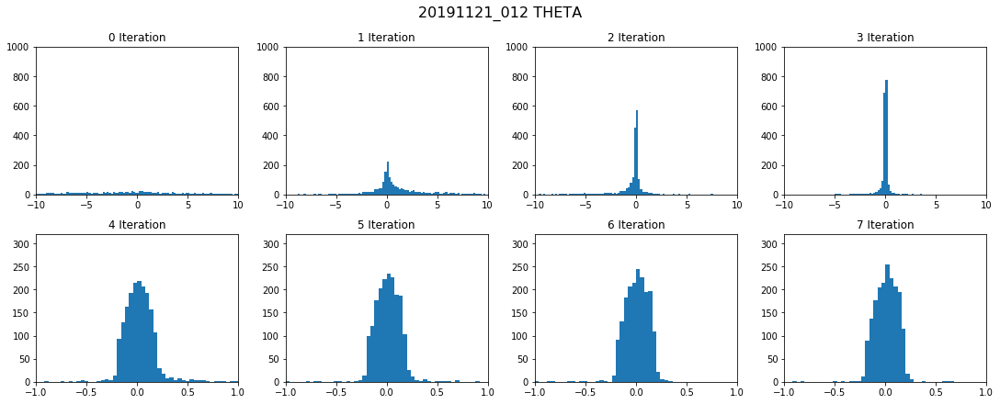

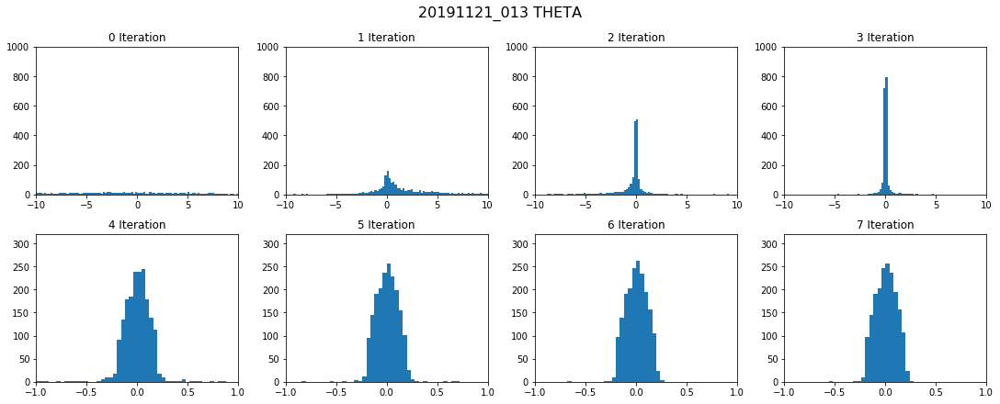

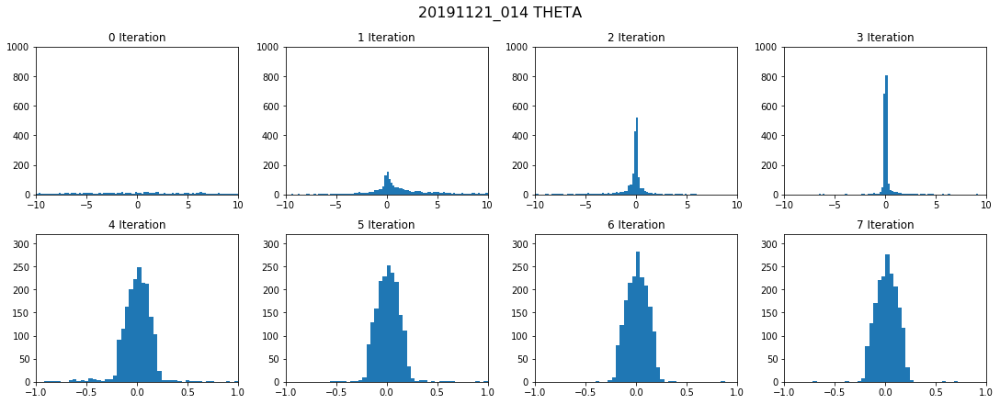

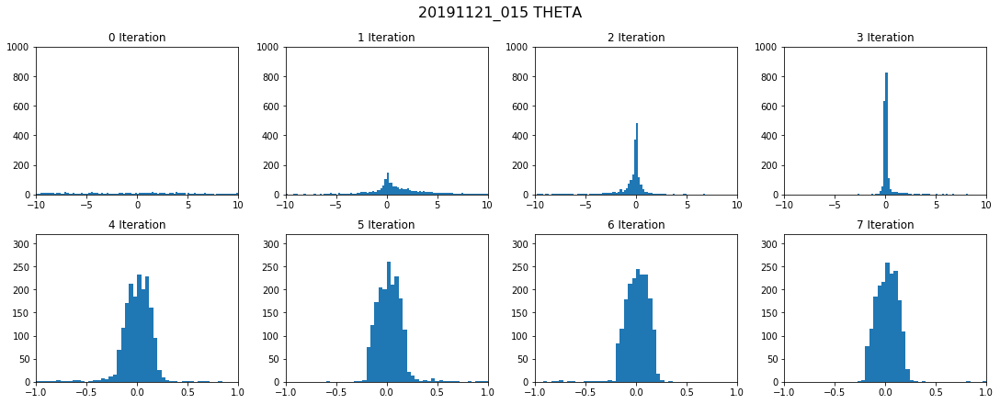

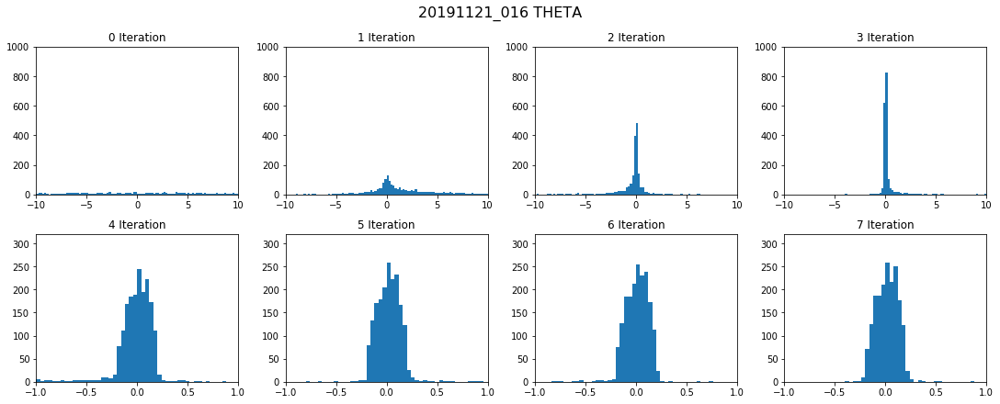

In [58]:
dirList = ['20191121_012', '20191121_013', '20191121_014', '20191121_015', '20191121_016']

for path in dirList:
    dataPath = f'/data/MCS/{path}/data/'
    phiData = np.load(dataPath+'thetaData.npy')
    
    fig, fax = plt.subplots(figsize=(15, 6),ncols=4, nrows=2, constrained_layout=True)
    fig.suptitle(f'{path} THETA', fontsize=16)
    for ite in range(8):
        diff = []
        runs = 34
        margin = 15
        for i in range(runs):
            if runs > 1:
                angle = np.deg2rad(margin + (360 - 2 * margin) * i / (runs - 1))
            else:
                angle = np.deg2rad(180)
            for cob in goodIdx:
                diff.append(np.rad2deg(angle - phiData[cob,i,ite,0]))
        x= (np.arange(100)-50)/100
        diff = np.array(diff)

        
        if ite < 4:
            fax[int(ite/4), ite%4].hist(diff, bins=100,range=(-10,10))
            fax[int(ite/4), ite%4].set_xlim([-10, 10])
            fax[int(ite/4), ite%4].set_ylim([0, 1000])
        else:
            fax[int(ite/4), ite%4].hist(diff, bins=50,range=(-1,1))
            fax[int(ite/4), ite%4].set_xlim([-1, 1])
            fax[int(ite/4), ite%4].set_ylim([0, 320])

        
        fax[int(ite/4), ite%4].title.set_text(f'{ite} Iteration')

    plt.savefig(f'{path}.png')